# Import libraries

In [1]:
import os
import cv2 as cv

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
import keras.utils as image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
training_path = '../input/cat-and-dog/training_set/training_set/'
test_path = '../input/cat-and-dog/test_set/test_set/'

#'/kaggle/input/cat-and-dog/test_set/test_set/cats'

In [3]:
# Function to display a picture of a cat/dog and it's respective label
def plot_image(path, int_type):
    _path = path
    label = None
    if int_type == 0:
        _path = _path + "/" + "cats"
        label = 0
    else:
        _path = _path + "/" + "dogs"
        label = 1
    
    plt.figure(figsize=(30, 30))
    plt.subplots_adjust(top=None, bottom=None, left=None, right=None, wspace=0.2, hspace=0.5)
    
    lst_img_name = os.listdir(_path)
    for i in range(1, 17, 1):
        th = np.random.randint(0, len(lst_img_name) - 1)
        plt.subplot(4, 4, i)
        img = _path + "/" + lst_img_name[th]
        img = cv.imread(img)
        plt.imshow(img)
        if label == 0:
            plt.title("Cat")
        else:
            plt.title("Dog")


# Visualizing our data

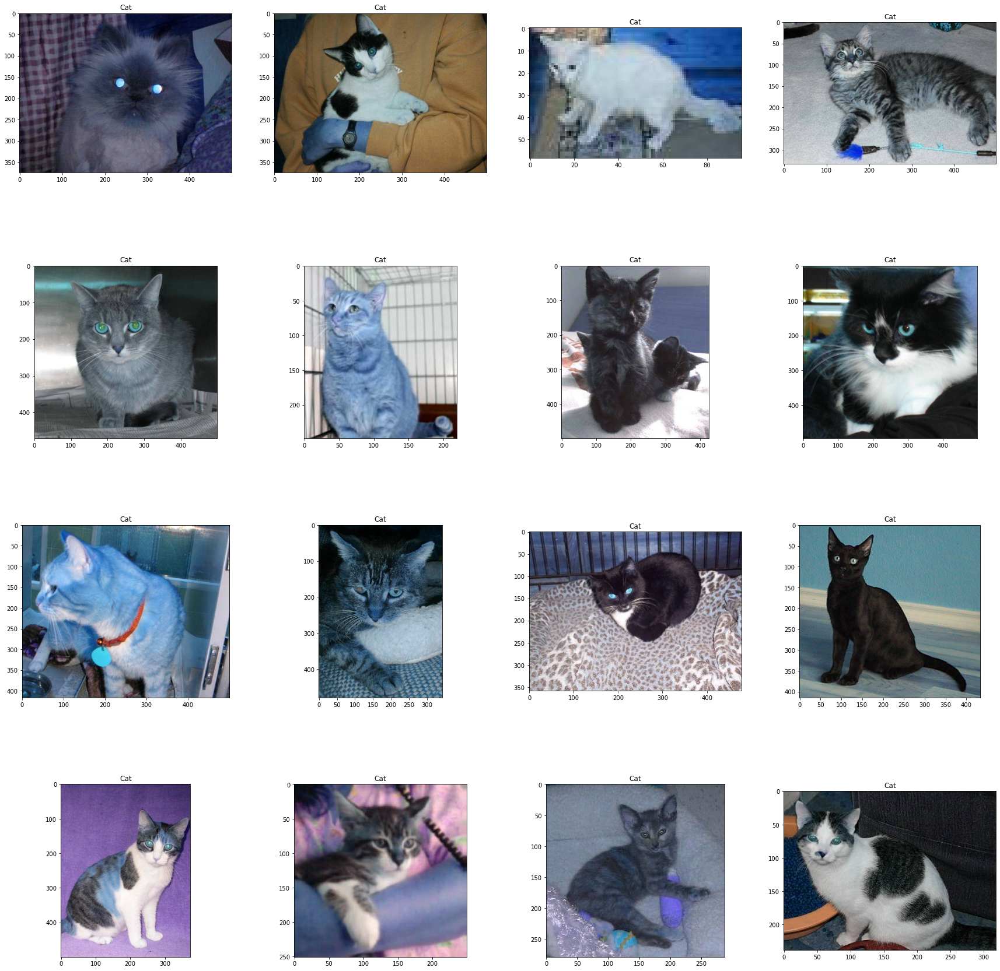

In [4]:
#Cats in the train dataset.
plot_image(training_path, 0)

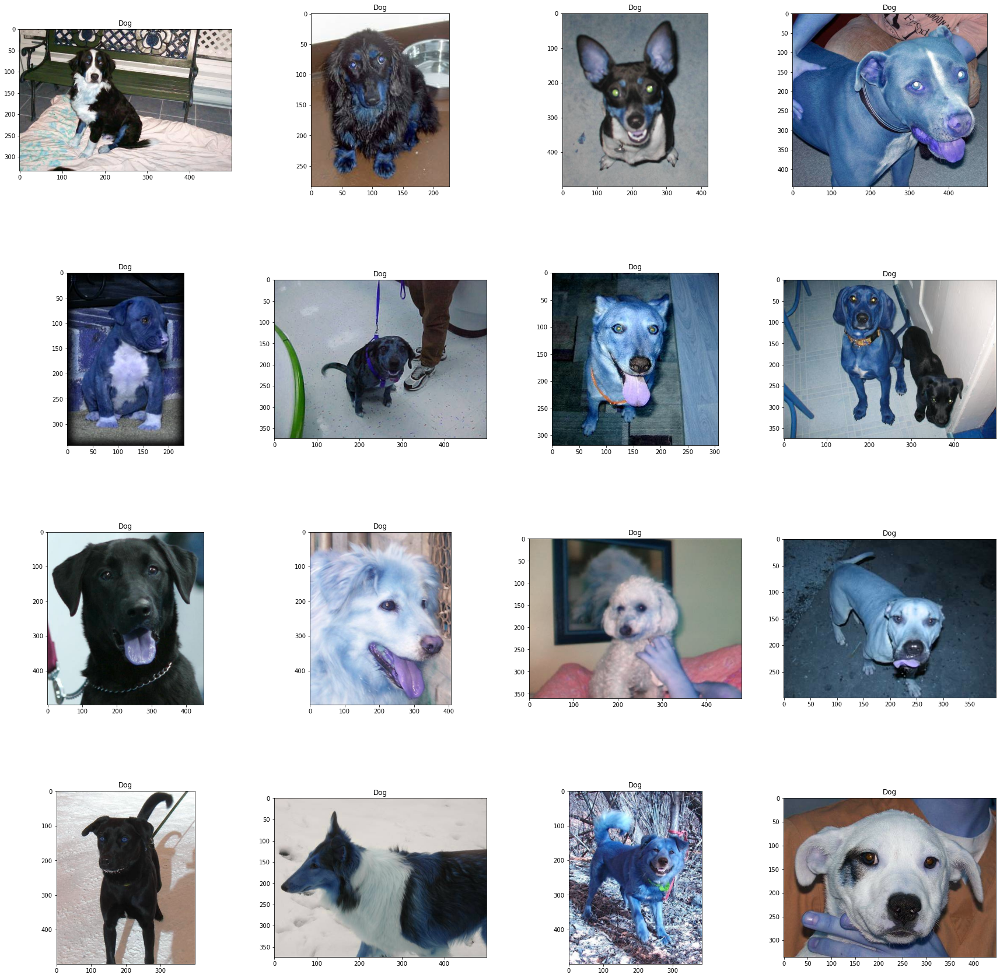

In [5]:
#Dogs in the dataset.
plot_image(training_path, 1)

# Model implementation

In [6]:
# Data Augmentation
train_data=ImageDataGenerator(rescale=1./255)
test_data=ImageDataGenerator(rescale=1./255)

In [7]:
# Fixing variables to train and test our data on
train_data=train_data.flow_from_directory(
            directory=training_path, 
            batch_size=32, 
            target_size=(48,48), 
            class_mode='categorical')

test_data=test_data.flow_from_directory(
            directory=test_path, 
            batch_size=32, 
            target_size=(48,48), 
            class_mode='categorical')

Found 8005 images belonging to 2 classes.
Found 2023 images belonging to 2 classes.


In [8]:
# Defining CNN
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator

model = Sequential()

model.add(Conv2D(8, kernel_size=(3, 3), activation='relu', input_shape=(48,48,3)))

model.add(Conv2D(16, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='sigmoid'))

2023-02-21 06:34:48.669715: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [9]:
# Compliling the model defined above
model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.0001, decay=1e-6), metrics=['accuracy'])

In [10]:
# What layers does our model have and how many parameters pass through each layer
model.summary() 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 8)         224       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 44, 44, 16)        1168      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 22, 22, 16)        0         
_________________________________________________________________
dropout (Dropout)            (None, 22, 22, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 20, 20, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 10, 10, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 32)          9

In [11]:
# Fitting the model - training and validation happens here
model_info = model.fit(train_data, epochs=25, validation_data=test_data)

2023-02-21 06:34:49.573370: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/25
251/251 [==============================] - 105s 417ms/step - loss: 0.6958 - accuracy: 0.5107 - val_loss: 0.6911 - val_accuracy: 0.5719
Epoch 2/25
251/251 [==============================] - 43s 169ms/step - loss: 0.6907 - accuracy: 0.5303 - val_loss: 0.6889 - val_accuracy: 0.5877
Epoch 3/25
251/251 [==============================] - 43s 171ms/step - loss: 0.6873 - accuracy: 0.5457 - val_loss: 0.6826 - val_accuracy: 0.5828
Epoch 4/25
251/251 [==============================] - 43s 171ms/step - loss: 0.6797 - accuracy: 0.5669 - val_loss: 0.6721 - val_accuracy: 0.5942
Epoch 5/25
251/251 [==============================] - 43s 172ms/step - loss: 0.6677 - accuracy: 0.6040 - val_loss: 0.6580 - val_accuracy: 0.6194
Epoch 6/25
251/251 [==============================] - 43s 172ms/step - loss: 0.6494 - accuracy: 0.6299 - val_loss: 0.6429 - val_accuracy: 0.6396
Epoch 7/25
251/251 [==============================] - 42s 166ms/step - loss: 0.6408 - accuracy: 0.6389 - val_loss: 0.6422 - val_a

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-package

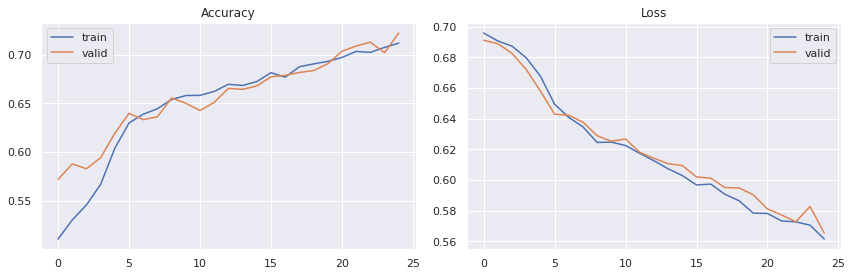

In [12]:
# Plotting a graph to see train and validation accuracy over the epochs
from matplotlib import pyplot

sns.set()
fig = pyplot.figure(0, (12, 4))

ax = pyplot.subplot(1, 2, 1)
sns.lineplot(model_info.epoch, model_info.history['accuracy'], label='train')
sns.lineplot(model_info.epoch, model_info.history['val_accuracy'], label='valid')
pyplot.title('Accuracy')
pyplot.tight_layout()

ax = pyplot.subplot(1, 2, 2)
sns.lineplot(model_info.epoch, model_info.history['loss'], label='train')
sns.lineplot(model_info.epoch, model_info.history['val_loss'], label='valid')
pyplot.title('Loss')
pyplot.tight_layout()

#pyplot.savefig('epoch_history_CNN.png')
pyplot.show()

# Prediction

In [13]:
#Predicted plot of the model.

def test_model(path, model, int_type):
    pred=[]
    _path = path
    label = None
    predict_label = None
    if int_type == 0:
        _path = _path + "/" + "cats"
        label = 0
    else:
        _path = _path + "/" + "dogs"
        label = 1
    
    plt.figure(figsize=(30, 30))
    plt.subplots_adjust(top=None, bottom=None, left=None, right=None, wspace=0.2, hspace=0.5)
    lst_img_name = os.listdir(_path)
    for i in range(1, 17, 1):
        th = np.random.randint(0, len(lst_img_name) - 1)
        plt.subplot(4, 4, i)
        img = _path + "/" + lst_img_name[th]
        image_test = image.load_img(img, target_size=(48,48, 3))
        image_test = image.img_to_array(image_test)
        image_test = np.expand_dims(image_test, axis = 0)
        predict = model.predict(image_test)
        #pred.append(predict)
        
        img = cv.imread(img)
        plt.imshow(img)
        
        if predict[0][0] > 0.5:
            predict_label = "Predic: Dog"
            pred.append("dog")
        else:
            predict_label = "Predic: Cat"
            pred.append("cat")
            
        if label == 0:
            plt.title("Real: Cat" + " - " + predict_label)
        else:
            plt.title("Real: Dog" + " - " + predict_label)

# Visualizing predictions

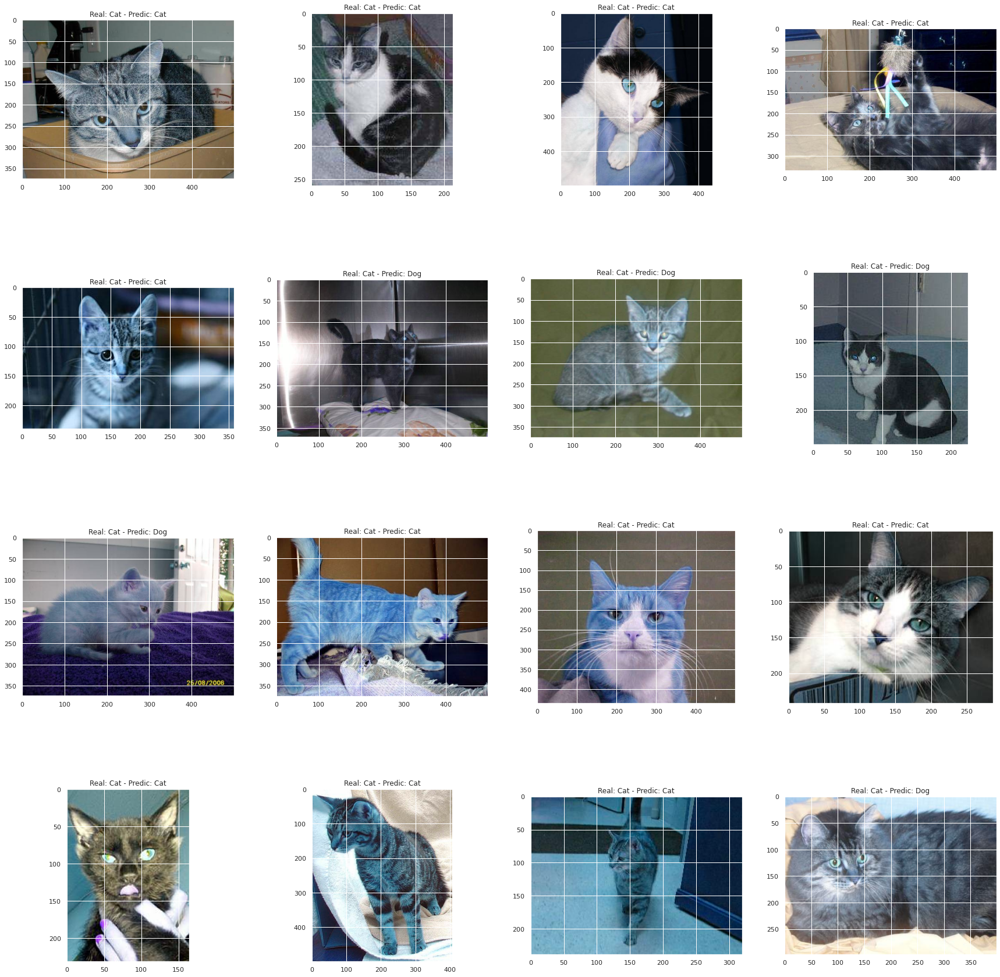

In [14]:
test_model(test_path, model, 0)

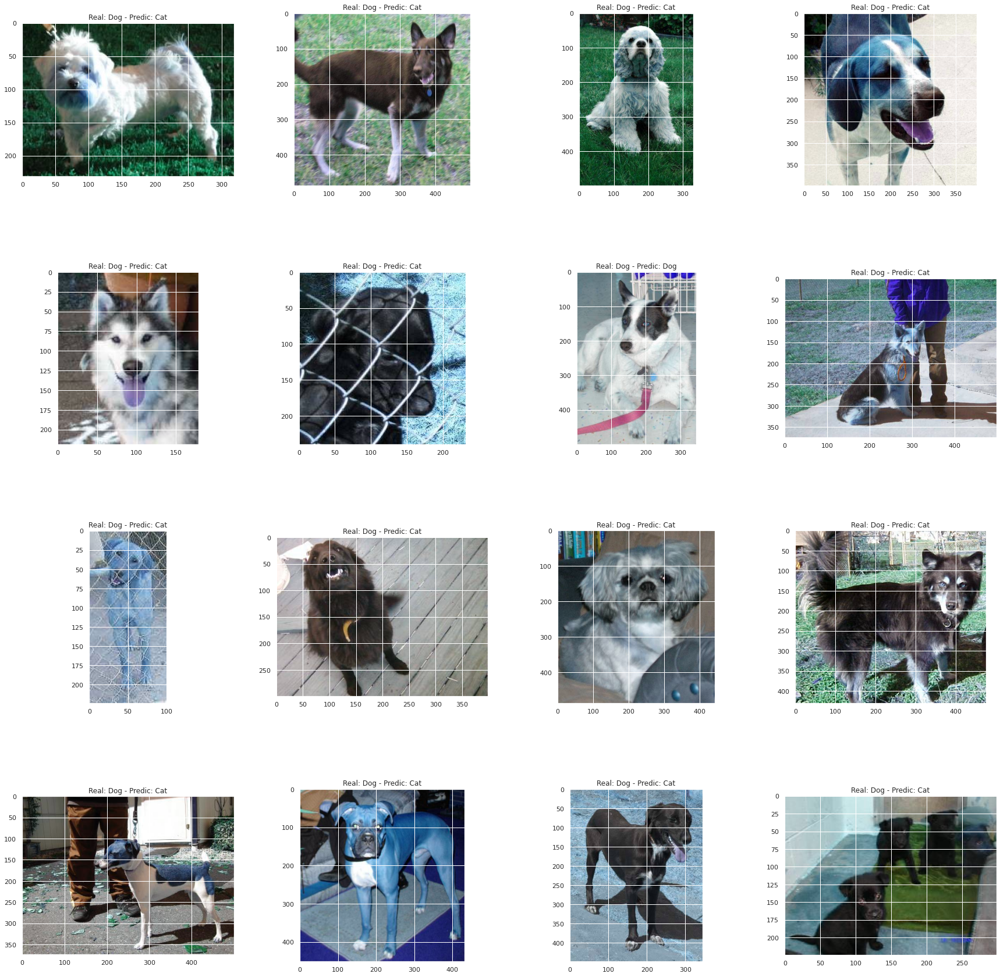

In [15]:
test_model(test_path, model, 1)